# Semiconductor Wafer Yield Analysis
이 노트북에서는 업로드된 `Wafer_15010_130532.csv` 파일을 이용해 웨이퍼 수율을 계산하고, EDA 및 분류 모델링을 수행합니다.

## 1. 환경 설정 및 라이브러리 Import

In [25]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

## 2. 데이터 로드

In [26]:
import os
import pandas as pd

folder_path = r"..\wafer_anal_prj"
csv_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.csv')]

# 각 CSV 파일을 읽어들여 딕셔너리에 저장 (key: 파일명, value: DataFrame)
dfs = {}
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    dfs[file] = pd.read_csv(file_path)

print("CSV 파일 로드 완료:", list(dfs.keys()))

CSV 파일 로드 완료: ['cleaned_wafer_data_sensor1_441_only.csv']


## 3. 데이터 구조 확인

In [52]:
for file_name, df in dfs.items():
    print(f"\n===== {file_name} 데이터프레임 정보 =====")
    df.info()
    
    print(f"\n----- {file_name} 기술 통계 (수치형 및 범주형) -----")
    print(df.describe(include='all'))
    
    print(f"\n----- {file_name} 각 컬럼별 결측치 수 -----")
    print(df.isnull().sum())


===== Wafer_CMP_Like_Normalized.csv 데이터프레임 정보 =====
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Columns: 591 entries, Wafer ID to Sensor-590
dtypes: float64(590), object(1)
memory usage: 461.8+ KB

----- Wafer_CMP_Like_Normalized.csv 기술 통계 (수치형 및 범주형) -----
         Wafer ID    Sensor-1    Sensor-2    Sensor-3    Sensor-4    Sensor-5  \
count         100  100.000000  100.000000  100.000000  100.000000  100.000000   
unique        100         NaN         NaN         NaN         NaN         NaN   
top     Wafer-300         NaN         NaN         NaN         NaN         NaN   
freq            1         NaN         NaN         NaN         NaN         NaN   
mean          NaN  103.684300  104.452420  104.175778  105.786298  102.033189   
std           NaN    5.164493    5.550435    6.098763   10.144800    8.982657   
min           NaN   90.000000   90.000000   90.000000   90.000000   90.000000   
25%           NaN   99.729610  101.915277  102.360816   95.872275 

## 4. 수율 계산

In [53]:
for col in df.columns:
    print(f"컬럼명: {col}")
    print(df[col].unique())
    print("-" * 40)

컬럼명: Wafer ID
['Wafer-300' 'Wafer-301' 'Wafer-302' 'Wafer-303' 'Wafer-304' 'Wafer-305'
 'Wafer-306' 'Wafer-307' 'Wafer-308' 'Wafer-309' 'Wafer-310' 'Wafer-311'
 'Wafer-312' 'Wafer-313' 'Wafer-314' 'Wafer-315' 'Wafer-316' 'Wafer-317'
 'Wafer-318' 'Wafer-319' 'Wafer-320' 'Wafer-321' 'Wafer-322' 'Wafer-323'
 'Wafer-324' 'Wafer-325' 'Wafer-326' 'Wafer-327' 'Wafer-328' 'Wafer-329'
 'Wafer-330' 'Wafer-331' 'Wafer-332' 'Wafer-333' 'Wafer-334' 'Wafer-335'
 'Wafer-336' 'Wafer-337' 'Wafer-338' 'Wafer-339' 'Wafer-340' 'Wafer-341'
 'Wafer-342' 'Wafer-343' 'Wafer-344' 'Wafer-345' 'Wafer-346' 'Wafer-347'
 'Wafer-348' 'Wafer-349' 'Wafer-350' 'Wafer-351' 'Wafer-352' 'Wafer-353'
 'Wafer-354' 'Wafer-355' 'Wafer-356' 'Wafer-357' 'Wafer-358' 'Wafer-359'
 'Wafer-360' 'Wafer-361' 'Wafer-362' 'Wafer-363' 'Wafer-364' 'Wafer-365'
 'Wafer-366' 'Wafer-367' 'Wafer-368' 'Wafer-369' 'Wafer-370' 'Wafer-371'
 'Wafer-372' 'Wafer-373' 'Wafer-374' 'Wafer-375' 'Wafer-376' 'Wafer-377'
 'Wafer-378' 'Wafer-379' 'Wafer-380' 

In [54]:
df.columns = df.columns.str.strip().str.lower()
print(df.columns.tolist())

['wafer id', 'sensor-1', 'sensor-2', 'sensor-3', 'sensor-4', 'sensor-5', 'sensor-6', 'sensor-7', 'sensor-8', 'sensor-9', 'sensor-10', 'sensor-11', 'sensor-12', 'sensor-13', 'sensor-14', 'sensor-15', 'sensor-16', 'sensor-17', 'sensor-18', 'sensor-19', 'sensor-20', 'sensor-21', 'sensor-22', 'sensor-23', 'sensor-24', 'sensor-25', 'sensor-26', 'sensor-27', 'sensor-28', 'sensor-29', 'sensor-30', 'sensor-31', 'sensor-32', 'sensor-33', 'sensor-34', 'sensor-35', 'sensor-36', 'sensor-37', 'sensor-38', 'sensor-39', 'sensor-40', 'sensor-41', 'sensor-42', 'sensor-43', 'sensor-44', 'sensor-45', 'sensor-46', 'sensor-47', 'sensor-48', 'sensor-49', 'sensor-50', 'sensor-51', 'sensor-52', 'sensor-53', 'sensor-54', 'sensor-55', 'sensor-56', 'sensor-57', 'sensor-58', 'sensor-59', 'sensor-60', 'sensor-61', 'sensor-62', 'sensor-63', 'sensor-64', 'sensor-65', 'sensor-66', 'sensor-67', 'sensor-68', 'sensor-69', 'sensor-70', 'sensor-71', 'sensor-72', 'sensor-73', 'sensor-74', 'sensor-75', 'sensor-76', 'sensor-

In [55]:
# 예를 들어 'result' 컬럼이 양품/불량을 구분한다면
if 'result' in df.columns:
    total = len(df)
    good_count = df[df['result'].str.lower() == 'good'].shape[0]
    yield_rate = good_count / total * 100
    print(f'전체 웨이퍼: {total}장, 양품: {good_count}장 → 수율: {yield_rate:.2f}%')
else:
    print("양품/불량 컬럼이 없습니다.")

양품/불량 컬럼이 없습니다.


## 8. 결론 및 결과 저장
- 필요 시 모델 성능 지표 및 예측 결과를 CSV로 저장하세요.
- 추가 분석: 중요 변수(feature importance) 시각화, 하이퍼파라미터 튜닝 등.

In [27]:
import pandas as pd

# 파일 읽기
df = pd.read_csv(r'..\wafer_anal_prj\cleaned_wafer_data_sensor1_441_only.csv')

# 상위 10개 행 미리보기
print(df.head(10))

     Sensor-1    Sensor-2    Sensor-3    Sensor-4    Sensor-5    Sensor-6  \
0  112.961392  112.839700  112.365881  112.280744  112.501013  112.694186   
1  111.872568  111.415660  111.988870  111.873155  111.682508  111.762997   
2  111.110510  111.129354  110.895027  111.006213  110.628319  110.752425   
3  110.775147  111.148870  111.057495  110.725653  111.440362  111.388236   
4  111.994671  112.040624  111.799380  111.973270  112.098650  111.810892   
5  111.717053  111.482557  111.454447  110.952282  110.898879  110.771800   
6  111.902022  112.077037  112.238688  112.086190  112.121634  111.864366   
7  108.013384  108.073294  108.005932  107.913389  107.484331  107.759779   
8  108.673323  108.434947  108.642312  108.591961  108.782161  108.434138   
9  111.515692  111.199426  110.489961  110.257055  110.495391  110.685258   

     Sensor-7    Sensor-8    Sensor-9   Sensor-10  ...  Sensor-434  \
0  112.233473  111.820050  111.417946  111.691771  ...  111.911089   
1  111.84273

In [57]:
print("컬럼명 목록:", df.columns.tolist())
for col in df.columns:
    print(f"\n[{col}] 고유값:")
    print(df[col].unique())

컬럼명 목록: ['Wafer ID', 'Sensor-1', 'Sensor-2', 'Sensor-3', 'Sensor-4', 'Sensor-5', 'Sensor-6', 'Sensor-7', 'Sensor-8', 'Sensor-9', 'Sensor-10', 'Sensor-11', 'Sensor-12', 'Sensor-13', 'Sensor-14', 'Sensor-15', 'Sensor-16', 'Sensor-17', 'Sensor-18', 'Sensor-19', 'Sensor-20', 'Sensor-21', 'Sensor-22', 'Sensor-23', 'Sensor-24', 'Sensor-25', 'Sensor-26', 'Sensor-27', 'Sensor-28', 'Sensor-29', 'Sensor-30', 'Sensor-31', 'Sensor-32', 'Sensor-33', 'Sensor-34', 'Sensor-35', 'Sensor-36', 'Sensor-37', 'Sensor-38', 'Sensor-39', 'Sensor-40', 'Sensor-41', 'Sensor-42', 'Sensor-43', 'Sensor-44', 'Sensor-45', 'Sensor-46', 'Sensor-47', 'Sensor-48', 'Sensor-49', 'Sensor-50', 'Sensor-51', 'Sensor-52', 'Sensor-53', 'Sensor-54', 'Sensor-55', 'Sensor-56', 'Sensor-57', 'Sensor-58', 'Sensor-59', 'Sensor-60', 'Sensor-61', 'Sensor-62', 'Sensor-63', 'Sensor-64', 'Sensor-65', 'Sensor-66', 'Sensor-67', 'Sensor-68', 'Sensor-69', 'Sensor-70', 'Sensor-71', 'Sensor-72', 'Sensor-73', 'Sensor-74', 'Sensor-75', 'Sensor-76', 

In [76]:
from sklearn.ensemble import IsolationForest

# 'Unnamed: 0' 컬럼이 있으면 제거
if 'Unnamed: 0' in df.columns:
    X = df.drop(columns=['Unnamed: 0'])
else:
    X = df.copy()

# 모든 값을 숫자로 변환
X = X.apply(pd.to_numeric, errors='coerce')

# 결측치가 많은 컬럼 확인
print("결측치가 있는 컬럼:", X.columns[X.isnull().any()].tolist())

# 결측치가 남아있는 컬럼 제거
X = X.dropna(axis=1)

# 행의 결측치도 제거
X = X.dropna(axis=0)

# 남아있는 결측치 수, shape 확인
print("남아있는 결측치 수:", X.isnull().sum().sum())
print("X shape:", X.shape)

# 이상치 탐지 모델
model = IsolationForest(contamination=0.05, random_state=42)
df = df.loc[X.index]  # X와 df의 인덱스 맞추기
df['outlier'] = model.fit_predict(X)
print(df[df['outlier'] == -1]['Unnamed: 0'] if 'Unnamed: 0' in df.columns else df[df['outlier'] == -1].index)
print(df['outlier'].value_counts())

결측치가 있는 컬럼: ['Label']
남아있는 결측치 수: 0
X shape: (100, 591)
Index([35, 51, 81, 86, 99], dtype='int64')
outlier
 1    95
-1     5
Name: count, dtype: int64


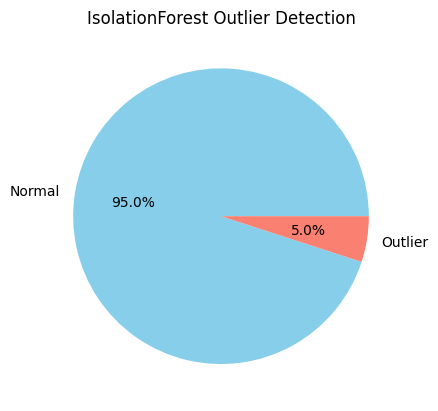

In [77]:
import matplotlib.pyplot as plt

df['outlier'].replace({1: 'Normal', -1: 'Outlier'}).value_counts().plot.pie(autopct='%1.1f%%', colors=['skyblue', 'salmon'])
plt.title('IsolationForest Outlier Detection')
plt.ylabel('')
plt.show()

In [28]:
def fill_nan_with_neighbors(arr, mask):
    # 간단한 NaN 보간 예시 (실제 상황에 맞게 수정 필요)
    arr_filled = arr.copy()
    nan_idx = np.where(np.isnan(arr_filled) & ~mask)
    for y, x in zip(*nan_idx):
        neighbors = []
        for dy in [-1, 0, 1]:
            for dx in [-1, 0, 1]:
                ny, nx = y + dy, x + dx
                if 0 <= ny < arr.shape[0] and 0 <= nx < arr.shape[1]:
                    if not np.isnan(arr_filled[ny, nx]) and not mask[ny, nx]:
                        neighbors.append(arr_filled[ny, nx])
        if neighbors:
            arr_filled[y, x] = np.mean(neighbors)
    return arr_filled

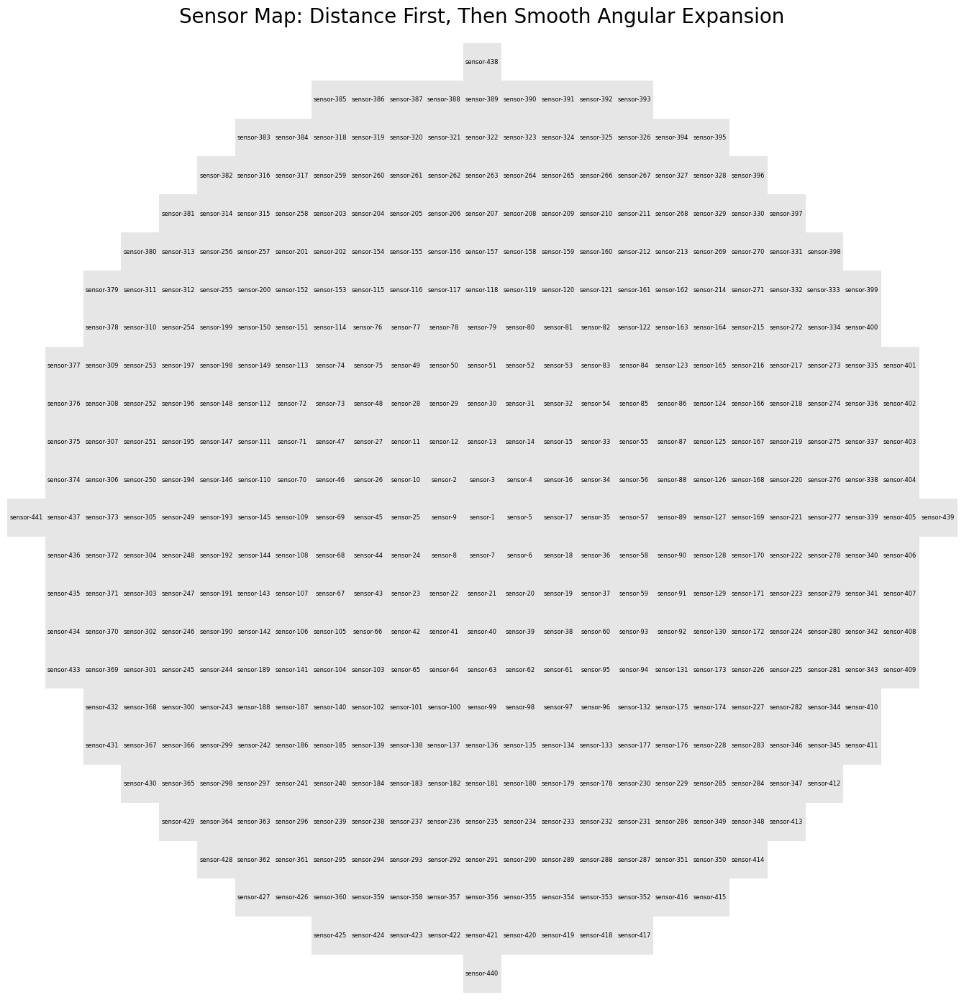

In [29]:
# 거리 우선 정렬 후, 각 거리 구간 내에서 점진적으로 각도 순서를 반영한 정렬 수행

from collections import defaultdict

# 거리(r)의 정수값을 기준으로 계층화
layered_coords = defaultdict(list)
for coord in coords:
    r = int(np.linalg.norm(np.array(coord) - center))
    layered_coords[r].append(coord)

# 거리 순으로 레이어 순회하면서 각도 기준 정렬
final_sorted_coords = []
for r in sorted(layered_coords.keys()):
    layer = layered_coords[r]
    sorted_layer = sorted(layer, key=lambda c: np.arctan2(c[0] - center_y, c[1] - center_x))
    final_sorted_coords.extend(sorted_layer)

# 센서 이름 생성 및 배치
sensor_map = np.full((rows, cols), '', dtype=object)
for idx, (i, j) in enumerate(final_sorted_coords):
    sensor_map[i, j] = f"sensor-{idx + 1}"

# 시각화
plt.figure(figsize=(14, 14))
plt.imshow(mask, cmap='Greys', alpha=0.1)
plt.title("Sensor Map: Distance First, Then Smooth Angular Expansion", fontsize=20, pad=20)

for i in range(rows):
    for j in range(cols):
        if sensor_map[i, j]:
            plt.text(j, i, sensor_map[i, j], ha='center', va='center', fontsize=6)

plt.axis('off')
plt.tight_layout()
plt.show()


In [30]:
# 컬럼명 전처리(공백 제거, 소문자 통일)
df.columns = df.columns.str.strip().str.lower()

# 센서 컬럼 추출 (sensor-로 시작)
sensor_cols = [col for col in df.columns if col.startswith('sensor-')]

# 센서 번호 기준으로 정렬
import re
def sensor_num(col):
    m = re.match(r'sensor-(\d+)', col)
    return int(m.group(1)) if m else 9999
sensor_cols = sorted(sensor_cols, key=sensor_num)

print(sensor_cols[:10])  # 앞부분 확인
print(sensor_cols[-10:]) # 뒷부분 확인

['sensor-1', 'sensor-2', 'sensor-3', 'sensor-4', 'sensor-5', 'sensor-6', 'sensor-7', 'sensor-8', 'sensor-9', 'sensor-10']
['sensor-432', 'sensor-433', 'sensor-434', 'sensor-435', 'sensor-436', 'sensor-437', 'sensor-438', 'sensor-439', 'sensor-440', 'sensor-441']


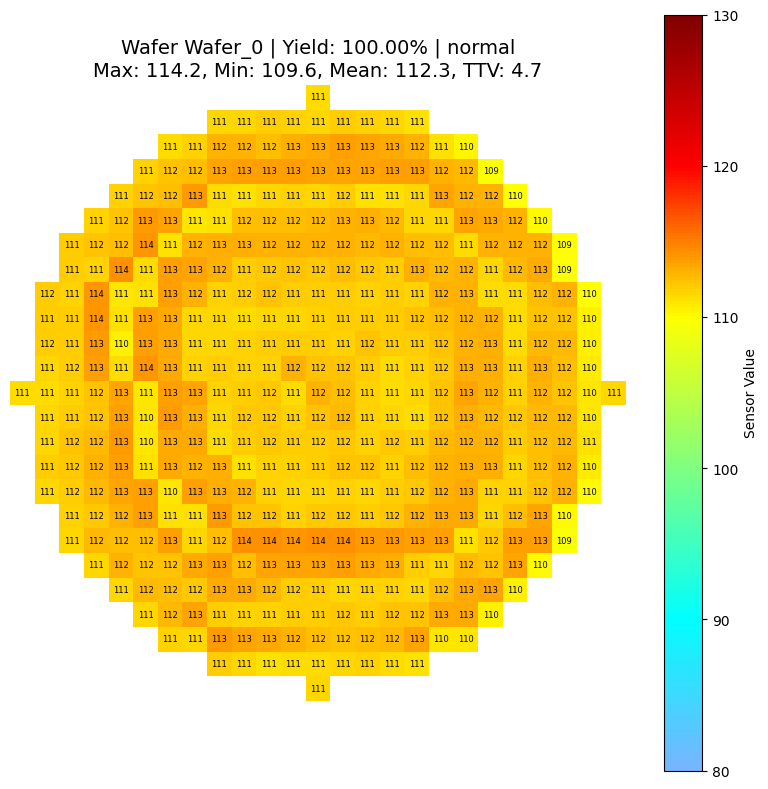

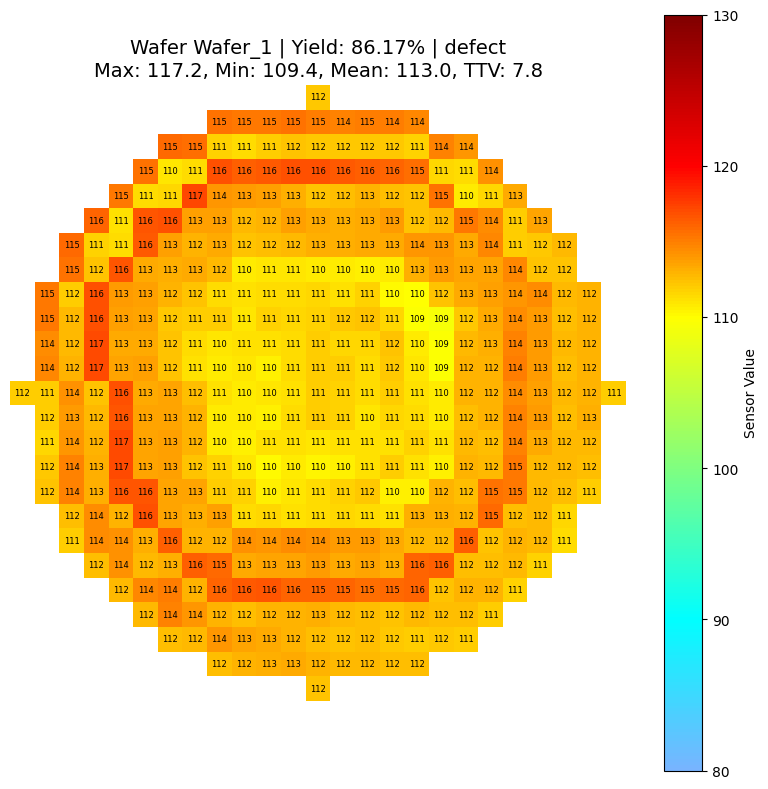

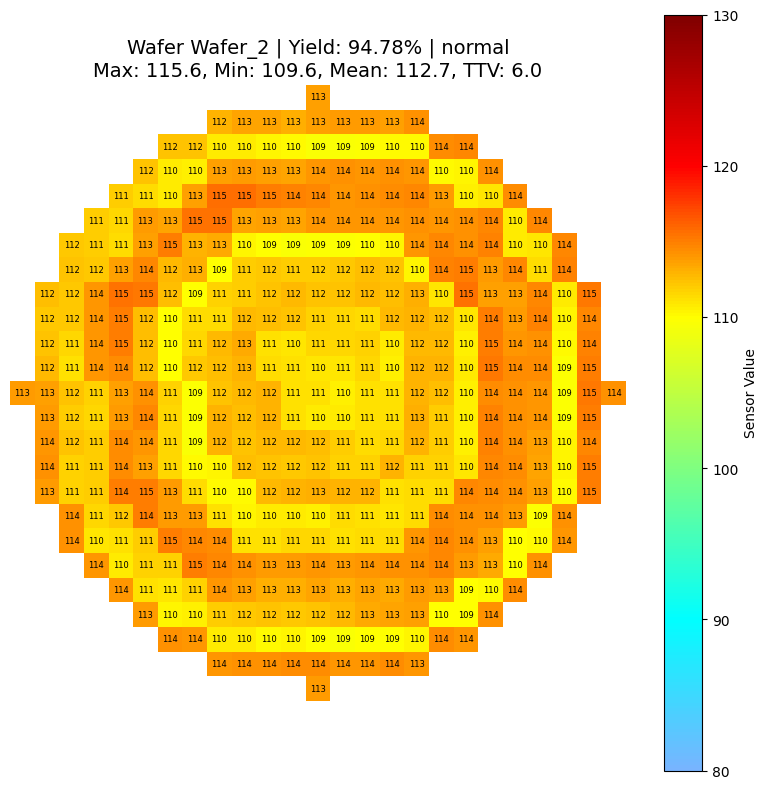

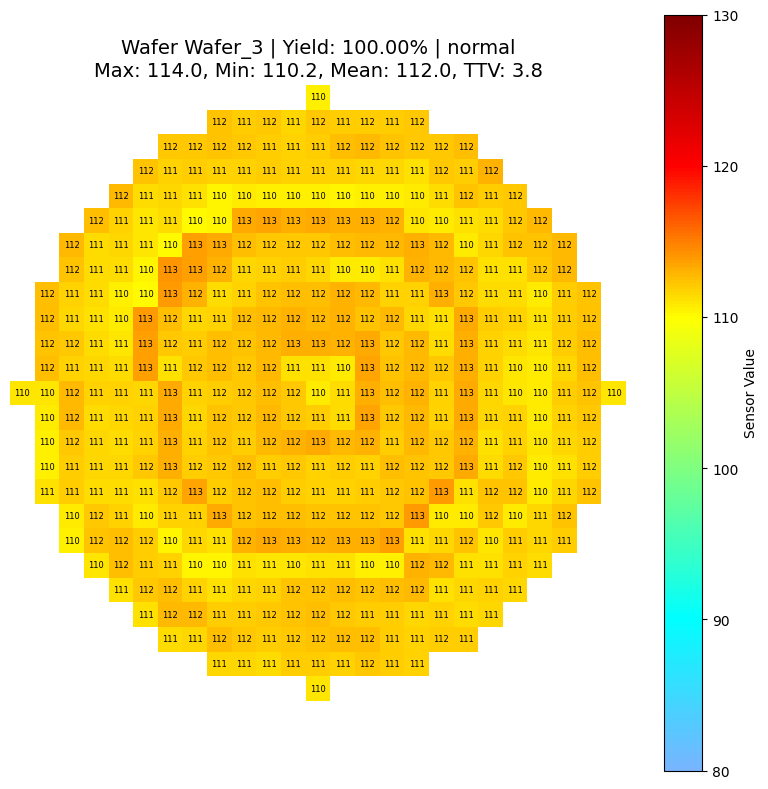

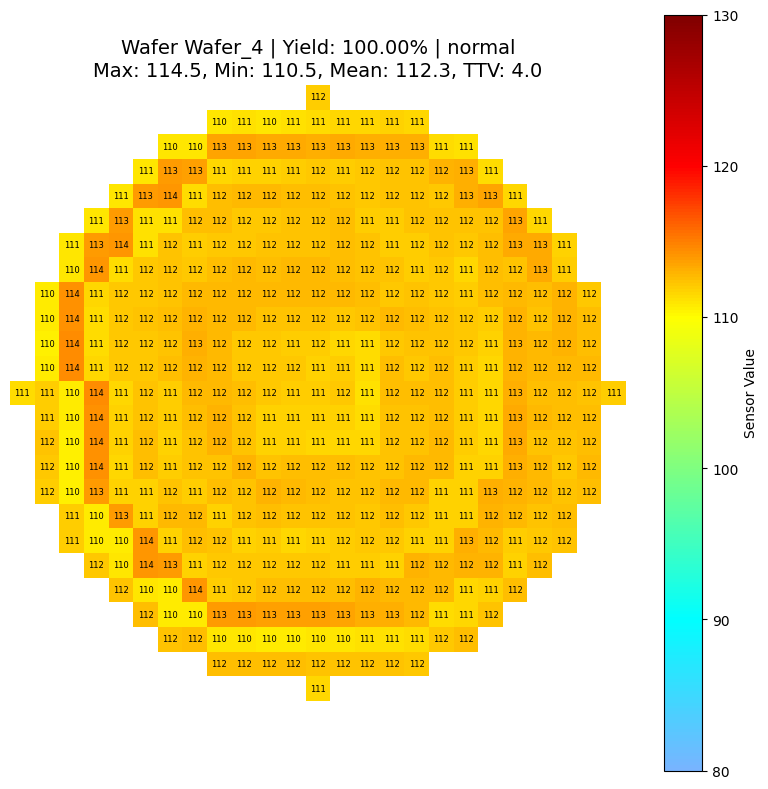

...

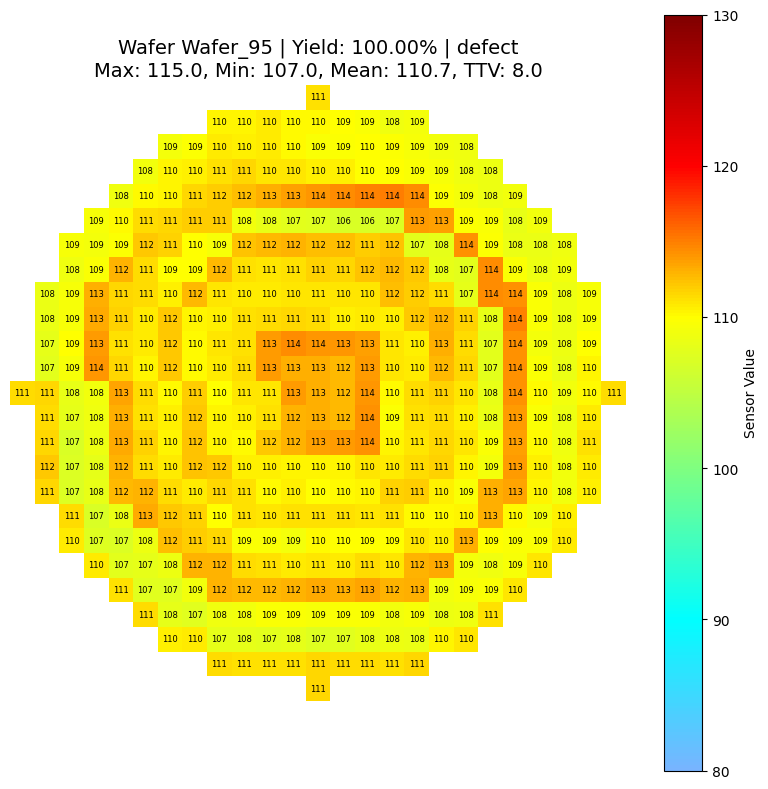

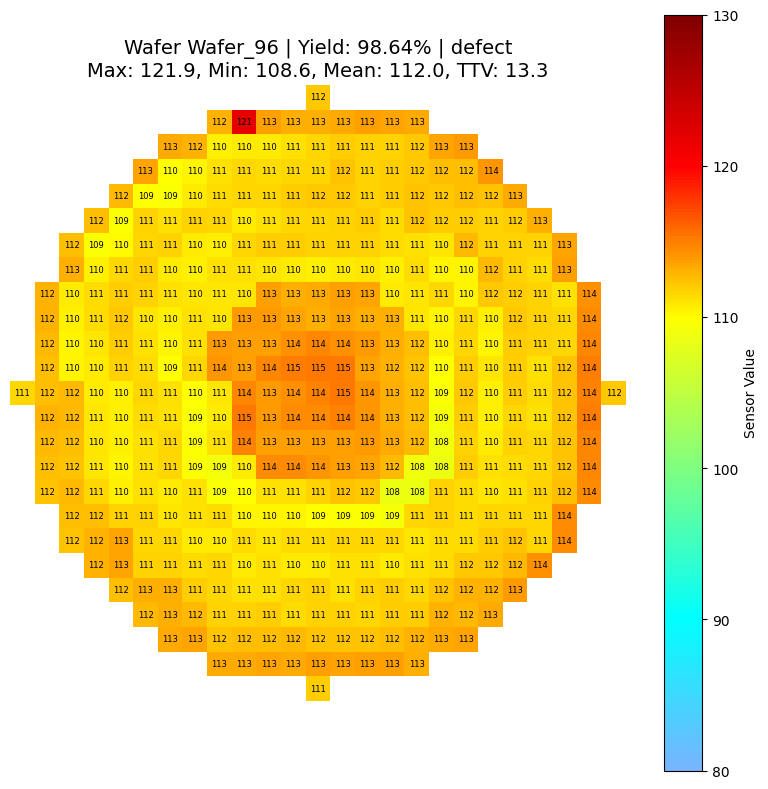

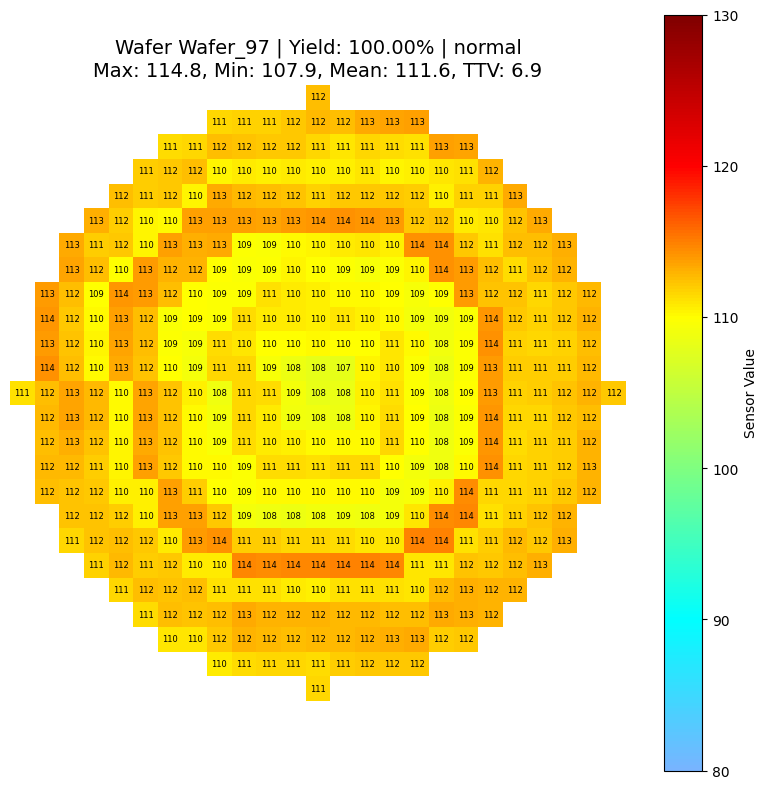

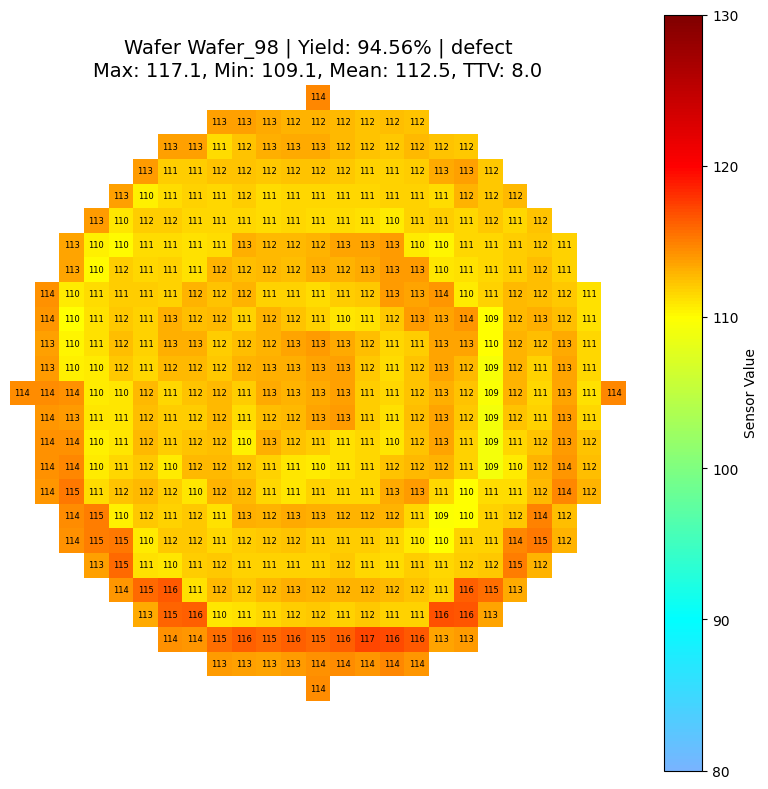

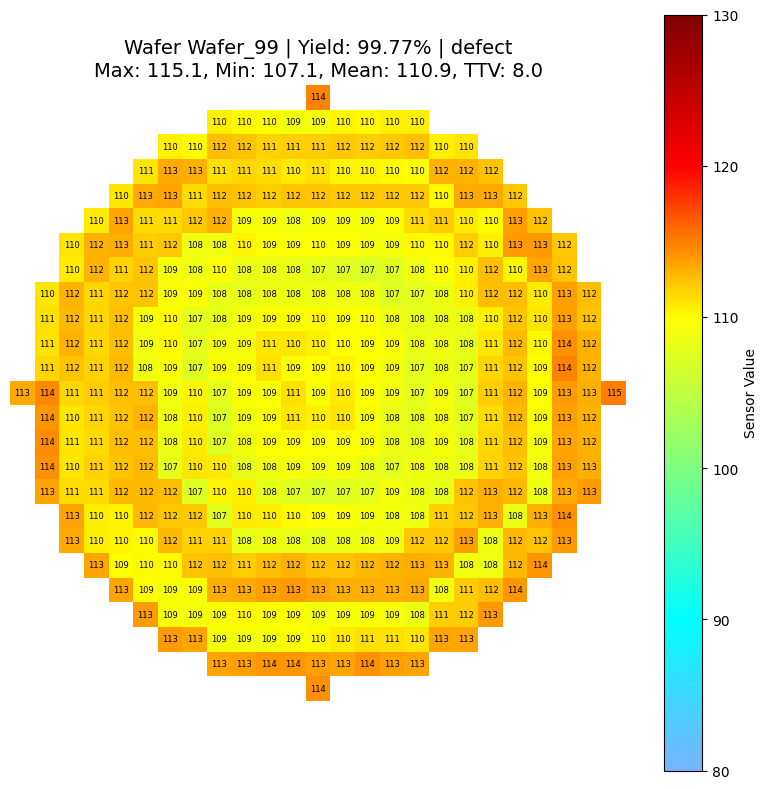

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.colors import LinearSegmentedColormap
from collections import defaultdict

# --- 기본 설정 ---
rows, cols = 25, 25
sensor_shape = (rows, cols)
yy, xx = np.ogrid[:rows, :cols]
center_y, center_x = (rows - 1) / 2, (cols - 1) / 2
radius = min(center_y, center_x)
mask = (yy - center_y)**2 + (xx - center_x)**2 <= radius**2
center = np.array([center_y, center_x])

# --- 새로운 정렬 방식 적용 ---
coords = list(zip(*np.where(mask)))
layered_coords = defaultdict(list)
for coord in coords:
    r = int(np.linalg.norm(np.array(coord) - center))
    layered_coords[r].append(coord)

final_sorted_coords = []
for r in sorted(layered_coords.keys()):
    layer = layered_coords[r]
    sorted_layer = sorted(layer, key=lambda c: np.arctan2(c[0] - center_y, c[1] - center_x))
    final_sorted_coords.extend(sorted_layer)

# --- 센서 컬럼 정렬도 동일하게 적용 ---
df.columns = df.columns.str.strip().str.lower()
def sensor_num(col):
    m = re.match(r'sensor-0*(\d+)', col)
    return int(m.group(1)) if m else 9999

sensor_cols = [col for col in df.columns if col.startswith('sensor-')]
sensor_cols = sorted(sensor_cols, key=sensor_num)

# 정렬된 좌표 수에 맞게 센서 컬럼도 재정렬
sensor_cols = sensor_cols[:len(final_sorted_coords)]

# --- NaN 보정 함수 ---
def fill_nan_with_neighbors(arr, mask):
    filled = arr.copy()
    nan_mask = np.isnan(arr)
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            if nan_mask[i, j] and not mask[i, j]:
                neighbors = []
                for di in [-1, 0, 1]:
                    for dj in [-1, 0, 1]:
                        ni, nj = i + di, j + dj
                        if 0 <= ni < arr.shape[0] and 0 <= nj < arr.shape[1]:
                            if not np.isnan(arr[ni, nj]):
                                neighbors.append(arr[ni, nj])
                if neighbors:
                    filled[i, j] = np.mean(neighbors)
    return filled

# --- 분석 및 시각화 ---
defect_wafer_ids = []

for idx, row in df.iterrows():
    wafer_id = row.get('unnamed: 0', f'Wafer_{idx}')
    sensor_values = pd.to_numeric(row[sensor_cols], errors='coerce').values

    sensor_map = np.full(sensor_shape, np.nan)
    for i, (y, x) in enumerate(final_sorted_coords):
        if i < len(sensor_values):
            sensor_map[y, x] = sensor_values[i]

    # 수율 계산
    normal_sensor = ((sensor_map >= 105) & (sensor_map <= 115))
    normal_count = np.count_nonzero(normal_sensor)
    total_sensor = np.count_nonzero(~np.isnan(sensor_map))
    wafer_yield = normal_count / total_sensor * 100 if total_sensor > 0 else 0

    max_val = np.nanmax(sensor_map)
    min_val = np.nanmin(sensor_map)
    mean_val = np.nanmean(sensor_map)
    ttv = max_val - min_val

    if ttv > 7:
        defect_label = 'defect'
        defect_reasons = ['ttv>7']
    else:
        defect_count = 0
        defect_reasons = []
        if max_val >= 120:
            defect_count += 1
            defect_reasons.append('max>=120')
        if min_val < 90:
            defect_count += 1
            defect_reasons.append('min<90')
        if mean_val < 100:
            defect_count += 1
            defect_reasons.append('mean<100')
        defect_label = 'defect' if defect_count >= 3 else 'normal'

    if defect_label == 'defect':
        defect_wafer_ids.append((wafer_id, defect_reasons))

    # 시각화
    filled_map = fill_nan_with_neighbors(sensor_map, ~mask)
    cmap = LinearSegmentedColormap.from_list('custom', [
        (0, (120/255, 180/255, 255/255)),
        (0.2, (0, 1, 1)),
        (0.4, (0.5, 1, 0.5)),
        (0.6, (1, 1, 0)),
        (0.8, (1, 0, 0)),
        (1.0, (0.5, 0, 0))
    ])

    plt.figure(figsize=(8, 8))
    im = plt.imshow(np.ma.masked_where(~mask, filled_map), cmap=cmap, vmin=80, vmax=130)

    title = (
        f'Wafer {wafer_id} | Yield: {wafer_yield:.2f}% | {defect_label}\n'
        f'Max: {max_val:.1f}, Min: {min_val:.1f}, Mean: {mean_val:.1f}, TTV: {ttv:.1f}'
    )
    plt.title(title, fontsize=14)
    plt.colorbar(im, label='Sensor Value')

    for i in range(rows):
        for j in range(cols):
            if mask[i, j]:
                val = sensor_map[i, j]
                if np.isnan(val):
                    plt.text(j, i, f'{filled_map[i, j]:.0f}', ha='center', va='center', fontsize=6, color='blue')
                else:
                    plt.text(j, i, f'{int(val)}', ha='center', va='center', fontsize=6, color='black')

    plt.axis('off')
    plt.tight_layout()
    plt.show()


In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# CSV 파일 경로에 맞게 수정
df = pd.read_csv(r'C:\Users\geonhae\Pictures\캡스톤디자인\데이터\Wafer_15010_130532.csv')

sensor_cols = [col for col in df.columns if col.startswith('Sensor-')]

for i, row in df.iterrows():
    wafer_id = row['Unnamed: 0']
    outlier_flag = row['outlier'] if 'outlier' in df.columns else None  # outlier 컬럼이 없을 수도 있음
    sensor_values = row[sensor_cols].values
    sensor_map = np.full((24, 25), np.nan)
    sensor_map.flat[:len(sensor_values)] = sensor_values

    # 원형 마스크
    yy, xx = np.ogrid[:24, :25]
    center_y, center_x = 24/2 - 0.5, 25/2 - 0.5
    radius = min(center_y, center_x)
    mask = (yy - center_y)**2 + (xx - center_x)**2 > radius**2
    sensor_map_masked = np.ma.masked_where(mask, sensor_map)

    # 수율 계산 (NaN이 아닌 센서 중 0 이상을 정상으로 가정)
    valid_sensor = sensor_map[~mask]
    total_sensor = np.count_nonzero(~np.isnan(valid_sensor))
    good_sensor = np.count_nonzero((valid_sensor >= 0) & (~np.isnan(valid_sensor)))
    wafer_yield = good_sensor / total_sensor * 100 if total_sensor > 0 else 0

    plt.figure(figsize=(5,5))
    im = plt.imshow(sensor_map_masked, cmap='coolwarm', vmin=np.nanmin(df[sensor_cols].values), vmax=np.nanmax(df[sensor_cols].values))
    title = f'Wafer {wafer_id} | Yield: {wafer_yield:.2f}%'
    if outlier_flag == -1:
        title += ' (불량 wafer)'
    plt.title(title, fontsize=11)
    plt.colorbar(im, label='Sensor Value')

    # 각 위치에 센서값 또는 NaN 표시
    for y in range(sensor_map.shape[0]):
        for x in range(sensor_map.shape[1]):
            if not mask[y, x]:
                if np.isnan(sensor_map[y, x]):
                    plt.text(x, y, 'NaN', ha='center', va='center', fontsize=6, color='gray')
                else:
                    plt.text(x, y, f'{int(sensor_map[y, x])}', ha='center', va='center', fontsize=6, color='black')

    plt.axis('off')
    plt.tight_layout()
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\geonhae\\Pictures\\캡스톤디자인\\데이터\\Wafer_15010_130532.csv'

In [ ]:
total = len(df)
normal = (df['outlier'] == 1).sum()
outlier = (df['outlier'] == -1).sum()
yield_rate = normal / total * 100

print(f"전체 웨이퍼: {total}장")
print(f"정상(양품 추정): {normal}장")
print(f"이상치(불량 추정): {outlier}장")
print(f"IsolationForest 기반 수율(추정): {yield_rate:.2f}%")

전체 웨이퍼: 101장
정상(양품 추정): 96장
이상치(불량 추정): 5장
IsolationForest 기반 수율(추정): 95.05%
